# Рынок заведений общественного питания Москвы

**Цель проекта**

Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Входные данные**

Путь к файлу: /datasets/moscow_places.csv

   - name — название заведения;
   - address — адрес заведения;
   - category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
   - hours — информация о днях и часах работы;
   - lat — широта географической точки, в которой находится заведение;
   - lng — долгота географической точки, в которой находится заведение;
   - rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
   - price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
   - avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
 

   - middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

   - middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
    
   - chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
    
   - district — административный район, в котором находится заведение, например Центральный административный округ;
   - seats — количество посадочных мест.

**Ход исследования**

 - Обзор и предобработка данных
 - Анализ данных
 - Детализируем исследование: открытие кофейни
 - Презентация

## Обзор

In [1]:
#загружаем библеотеки 
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings; warnings.filterwarnings(action='ignore')
from plotly import graph_objects as go
from IPython.display import set_matplotlib_formats
import json
import folium
# импортируем карту и маркер
from folium import Map, Choropleth, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
import re

In [2]:
# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

# снимаем ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)

# игнорируем предупреждения
pd.set_option('chained_assignment', None)

# выставляем ограничение на показ знаков после запятой
pd.options.display.float_format = '{:,.1f}'.format

# устанавливаем стиль графиков
sns.set_style('whitegrid')
sns.set(rc={"figure.dpi":100, 'savefig.dpi':300})
sns.set_context('notebook')  
sns.set_style("ticks")

In [3]:
# чтение файлов с данными и сохранение в data

try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

In [4]:
#обзор
data.info()
data.head(10)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.9,37.5,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.9,37.5,4.5,выше среднего,Средний счёт:1500–1600 ₽,"1,550.0",NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.9,37.5,4.6,средние,Средний счёт:от 1000 ₽,"1,000.0",NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.9,37.5,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.9,37.4,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.9,37.5,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.9,37.5,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.9,37.5,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.9,37.5,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.9,37.5,4.3,средние,Средний счёт:1000–1200 ₽,"1,100.0",NaN,0,65.0


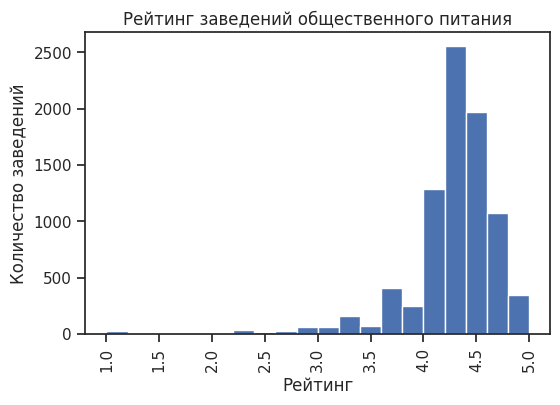

In [5]:
plt.hist(data['rating'], bins=20)
plt.xticks(rotation=90)
plt.title('Рейтинг заведений общественного питания')
plt.xlabel('Рейтинг')
plt.ylabel('Количество заведений')
plt.show()

In [6]:
print(data['seats'].describe())
data.query('seats > 1000').sample(5)

count   4,795.0
mean      108.4
std       122.8
min         0.0
25%        40.0
50%        75.0
75%       140.0
max     1,288.0
Name: seats, dtype: float64


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4231,РестоБар Argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.7,37.5,4.2,высокие,Средний счёт:2500–5000 ₽,"3,750.0",NaN,0,"1,200.0"
6684,Пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,NaN,55.7,37.5,4.5,NaN,NaN,NaN,NaN,0,"1,288.0"
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.7,37.5,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,"1,288.0"
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.7,37.5,4.8,NaN,NaN,NaN,NaN,1,"1,288.0"
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00–00:00",55.7,37.5,4.5,выше среднего,Средний счёт:1500 ₽,"1,500.0",NaN,1,"1,288.0"


**Вывод**

- Таблица содержит информацию о 8406 разнообразных точках питания в Москве.

- В среднем 108 посадочных мест, а медиана 75, но есть и заведения с 1000+ местами, для больших мероприятий.

- Большентсво заведений имеют рединг 4 и больше.

- На первый взгляд, данные не содержат пропусков, но кое-что требует правки: замена типа данных в столбце chain на булев.

## Предобработка данных

### Дубликаты

In [7]:
print('Количество дубликатов:', data.duplicated().sum())

Количество дубликатов: 0


### Пропущенные значения

In [8]:
print('Количество пропущенных значений:\n', data.isna().sum())

Количество пропущенных значений:
 name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


- Пропущенных значений слишком много, не будем трогать данные, чтобы не испортить статистику.

### Создаем столбец street с названиями улиц из столбца с адресом.

In [9]:
work_data = data

In [10]:
work_data['street'] = data['address'].str.split(',', expand=True)[1]
work_data['street'] = work_data['street'].str.strip()

### Создаем столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно.

Создаем столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [11]:
# создание столбца is_24/7
work_data['is_24/7'] = work_data['hours'].str.contains('ежедневно', case=False) & data['hours'].str.contains('круглосуточно', case=False)

# преобразование значений в логические
work_data['is_24/7'] = work_data['is_24/7'].astype(bool)
work_data.columns

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats', 'street', 'is_24/7'],
      dtype='object')

### Замена типа данных в столбце chain на булев.

In [12]:
work_data['chain'] = work_data['chain'].astype(bool)

### Неявные  дубликаты

In [13]:
# приводим значения к верхнему регистру, убираем крайние пробелы

work_data['name'] = work_data['name'].str.upper()
work_data['name'] = work_data['name'].str.strip()

In [14]:
pd.options.display.max_rows=100000
work_data[['name']].value_counts()

name                                                              
КАФЕ                                                                  189
ШОКОЛАДНИЦА                                                           120
ДОМИНО'С ПИЦЦА                                                         77
ДОДО ПИЦЦА                                                             74
ONE PRICE COFFEE                                                       72
ЯНДЕКС ЛАВКА                                                           69
COFIX                                                                  65
PRIME                                                                  50
ХИНКАЛЬНАЯ                                                             44
ШАУРМА                                                                 43
КОФЕПОРТ                                                               42
КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ                                    39
ТЕРЕМОК                                      

- № 1 и №1
- хинкали - gaли! и хинкали-gaли!
- яндекс лавка и яндекс.лавка
- халаль и халяль

In [15]:
#переберёт каждую строку из списка, идентичного df['name'] и все ситуации с пробелом между № и числом
l=[]
for j in list(work_data['name']):
    r=''
    for u in range(len(j)):
        if j[u]==' ' and j[u-1]=='№':
            continue
        else:
            r=r+j[u]
    l.append(r)
work_data['name']=pd.Series(l)

In [16]:
work_data['name'] = work_data['name'].replace({'хинкали - gaли!':'хинкали-gaли!',
                               'яндекс.лавка':'яндекс лавка'})

In [17]:
h=[]
for j in list(work_data['name']):
    r=''
    for u in range(len(j)):
        if j[u]=='я' and (j[u-3:u]=='хал') and (j[u+1:u+3]=='ль'):
            r=r+'а'
        else:
            r=r+j[u]
    h.append(r)
work_data['name']=pd.Series(h)

In [18]:
work_data[['name']].value_counts()

name                                                              
КАФЕ                                                                  189
ШОКОЛАДНИЦА                                                           120
ДОМИНО'С ПИЦЦА                                                         77
ДОДО ПИЦЦА                                                             74
ONE PRICE COFFEE                                                       72
ЯНДЕКС ЛАВКА                                                           69
COFIX                                                                  65
PRIME                                                                  50
ХИНКАЛЬНАЯ                                                             44
ШАУРМА                                                                 43
КОФЕПОРТ                                                               42
КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ                                    39
ТЕРЕМОК                                      

In [19]:
work_data[['name', 'address']].duplicated().sum()

3

In [20]:
work_data[work_data[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1430,MORE POKE,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.8,37.5,4.2,NaN,NaN,NaN,NaN,False,188.0,Волоколамское шоссе,False
1511,MORE POKE,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.8,37.5,4.2,NaN,NaN,NaN,NaN,True,188.0,Волоколамское шоссе,False
2211,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.8,37.6,4.4,NaN,NaN,NaN,NaN,False,150.0,проспект Мира,False
2420,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.8,37.6,4.4,NaN,NaN,NaN,NaN,True,150.0,проспект Мира,False
3091,ХЛЕБ ДА ВЫПЕЧКА,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.7,37.4,4.1,NaN,NaN,NaN,NaN,True,276.0,Ярцевская улица,False
3109,ХЛЕБ ДА ВЫПЕЧКА,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.7,37.4,4.1,NaN,NaN,NaN,NaN,False,276.0,Ярцевская улица,False


## Анализ данных

### Категории заведений представлены в данных.

In [21]:
data_by_category = work_data.groupby('category').agg(count=('name','count')).reset_index().sort_values('count', ascending=False)
data_by_category['percent'] = data_by_category['count'] / sum(data_by_category['count']) * 100

data_by_category

,category,count,percent
3,кафе,2378,28.3
6,ресторан,2043,24.3
4,кофейня,1413,16.8
0,"бар,паб",765,9.1
5,пиццерия,633,7.5
2,быстрое питание,603,7.2
7,столовая,315,3.7
1,булочная,256,3.0


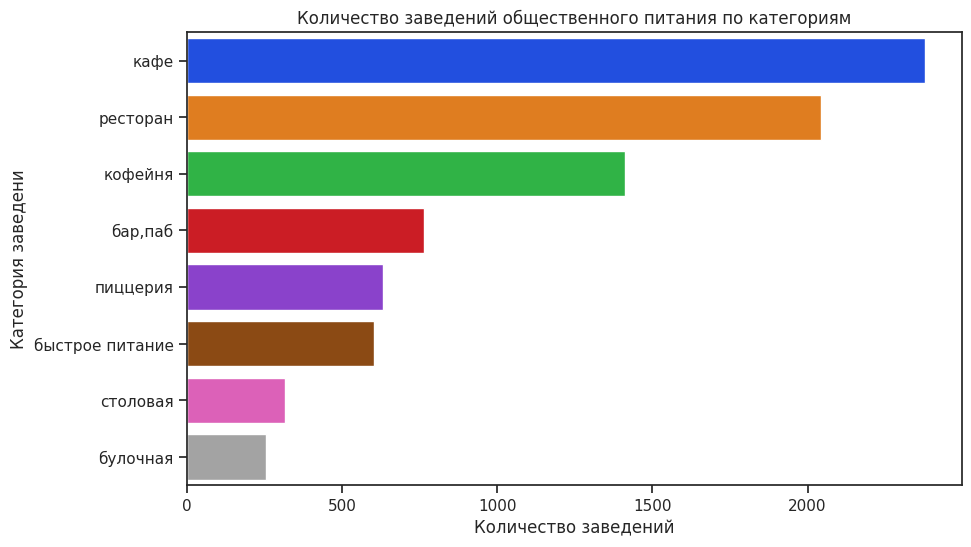

In [22]:
# группируем данные по категориям и находим топ-15 популярных
categories = work_data.groupby('category')['name'].count().sort_values(ascending=False)

# создаем график
plt.figure(figsize=(10,6))
sns.barplot(x=categories, y=categories.index, palette='bright')
plt.title('Количество заведений общественного питания по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведени')
plt.show()

- из таблицы и графика видно, что больше всего заведений в категории кафе(28.3%). Кафе, рестораны и кофейни составляют 69,4% от общего количества заведений.

### Исследование количество посадочных мест в местах по категориям.

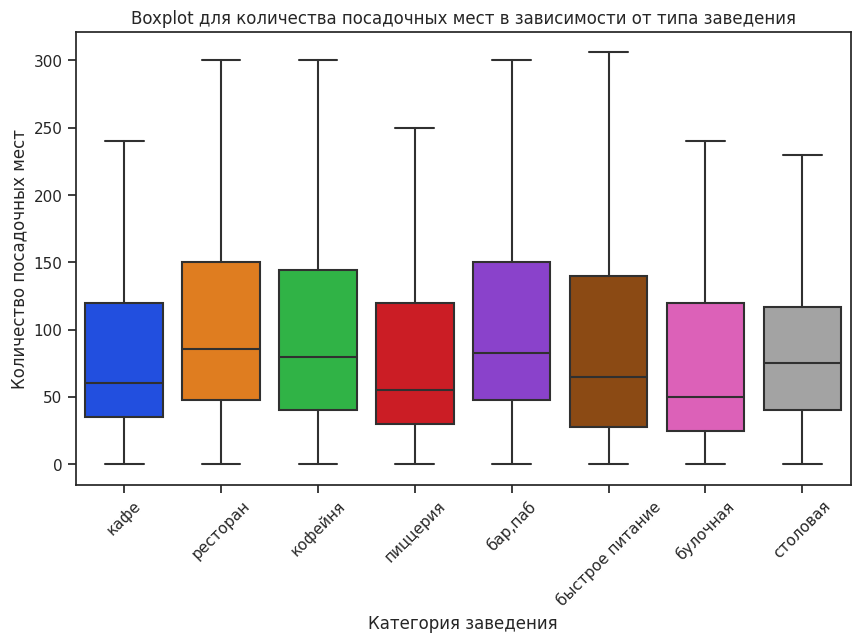

In [23]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='category', y='seats', data=work_data, showfliers=False, palette='bright')
plt.title('Boxplot для количества посадочных мест в зависимости от типа заведения')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.xticks(rotation=45)
plt.show()

- У рестаранов, баров, кофейни и быстрого питания максимальное число посадочных мест достигает 300-а, а в среднем 150. У остальных категорий максимальное кол-во мест доходит до 150-и, а всреднем до 125.

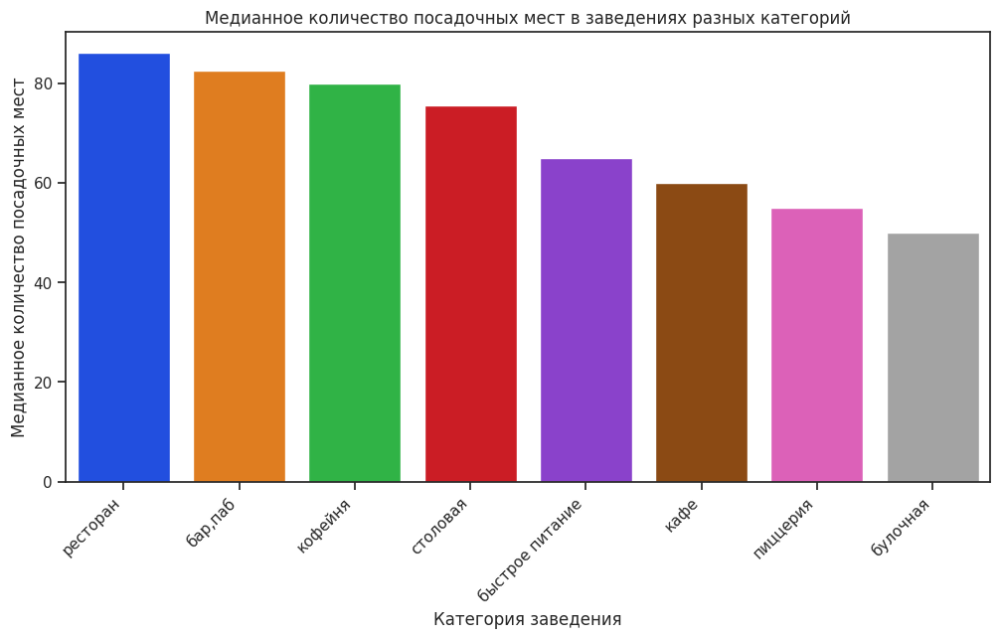

In [24]:
seats_by_category = work_data.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=seats_by_category, x='category', y='seats', palette='bright')
plt.xticks(rotation=45, ha='right')
plt.title('Медианное количество посадочных мест в заведениях разных категорий')
plt.xlabel('Категория заведения')
plt.ylabel('Медианное количество посадочных мест')
plt.show()

- У баров, кофейни, рестаранов и столовых медианное значение в пределах 80 мест. А остальные категории около 60-ти.

### Соотношение сетевых и несетевых заведений в датасете.

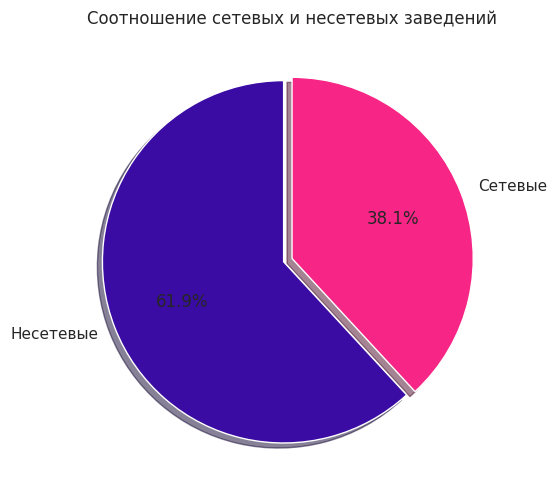

In [25]:
# Сгруппируем данные по типу объекта и сетевому признаку, подсчитав количество заведений в каждой категории
chain_info = work_data.groupby(['category', 'chain'])['name'].count().reset_index()

# Выберем только данные о несетевых заведениях
independent = chain_info[chain_info['chain'] == False]

# Выберем только данные о сетевых заведениях
chain = chain_info[chain_info['chain'] == True]

# Создадим круговую диаграмму
fig, ax = plt.subplots(figsize=(8, 6))

# Отрисуем сектора диаграммы
ax.pie(
    [independent['name'].sum(), chain['name'].sum()],
    labels=['Несетевые', 'Сетевые'],
    autopct='%1.1f%%',
    explode=[0.05, 0],
    shadow=True,
    startangle=90,
    colors=['#3A0CA3', '#F72585'],
)

# Добавим заголовок диаграммы
ax.set_title('Соотношение сетевых и несетевых заведений')

plt.show()

- Получается что 61,9% процент заведений не являются сетевыми, а 38,1% сетевые.

### Категории заведений, чаще всего являющееся сетевыми.

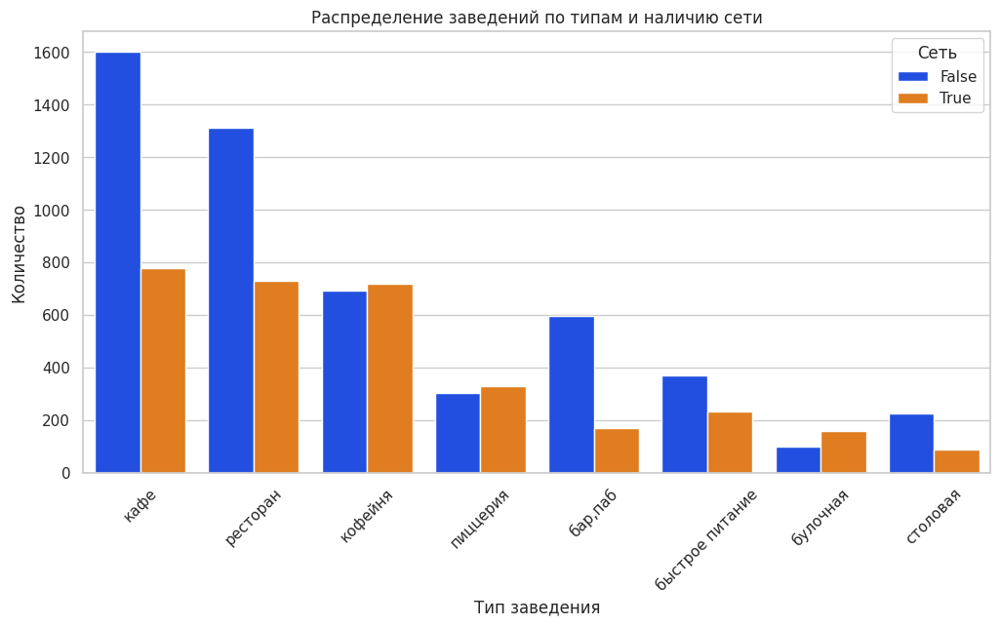

In [26]:
sns.set_style('whitegrid')
sns.set_palette('bright')

plt.figure(figsize=(12,6))
sns.countplot(x='category', hue='chain', data=work_data)
plt.title('Распределение заведений по типам и наличию сети')
plt.xlabel('Тип заведения')
plt.ylabel('Количество')
plt.xticks(rotation=45)
plt.legend(title='Сеть', loc='upper right')
plt.show()

- Больше всего несетевых мест по категориям. В категории "кофейня" и "пиццерия" примерно поровно сетевых и несетывых, а вот в категории "булочная" сетевых мест больше.

### Топ-15 популярных сетей в Москве.

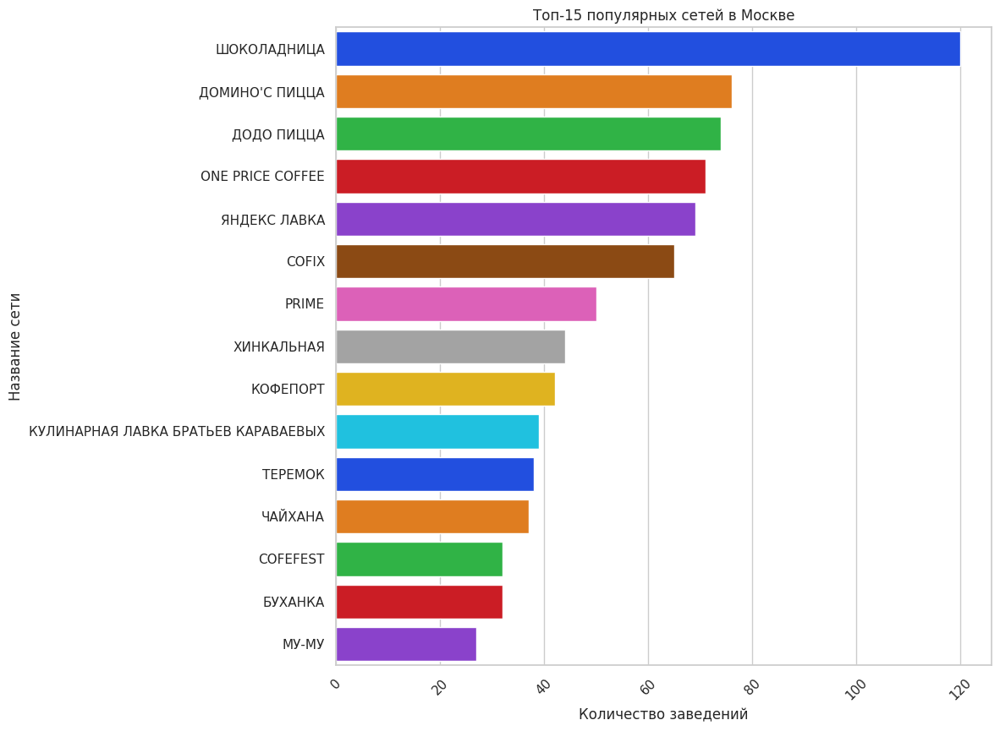

In [27]:
top_chains = work_data[work_data['chain'] == True].groupby('name').count().sort_values(by='category', ascending=False).head(15)

plt.figure(figsize=(10,10))
sns.barplot(x='category', y=top_chains.index, data=top_chains, palette='bright')
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')
plt.xticks(rotation=45)
plt.show()


- Из сетевых мест лидирует "Шоколадница", 2 и 3 места делят "Доминос Пицца" и "Додо Пицца".
- Большинство заведений имеют глобальное присутствие и имеют строгий брендинг в своих заведениях.

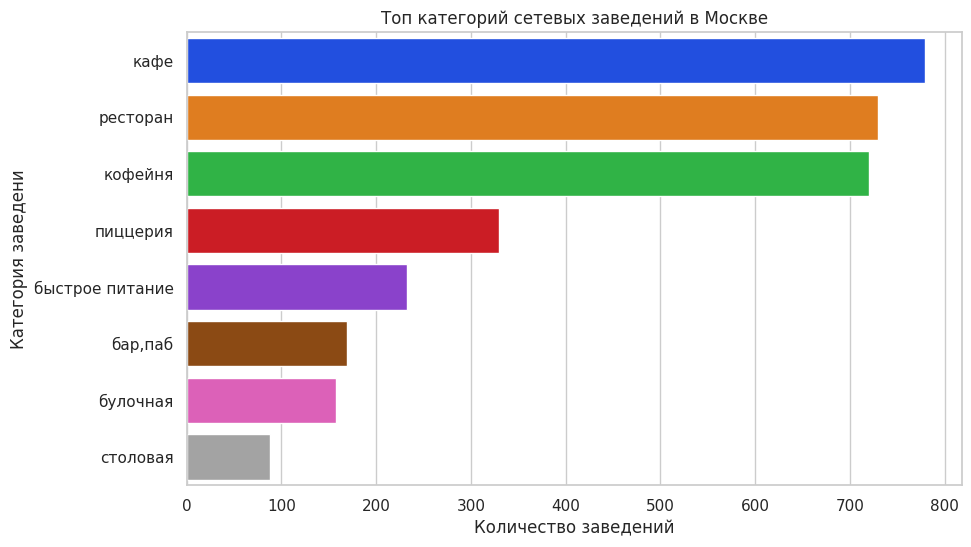

In [28]:
# группируем данные по категориям и находим топ-15 популярных
top_categories = work_data[work_data['chain'] == True].groupby('category')['name'].count().sort_values(ascending=False)

# создаем график
plt.figure(figsize=(10,6))
sns.barplot(x=top_categories, y=top_categories.index, palette='bright')
plt.title('Топ категорий сетевых заведений в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведени')
plt.show()

По категориям сетевых мест выходит, что кафе, рестораны и кофейни, занимают большую часть сетевых заведений. В категории пиццерия, есть два больших игрока "Доминос Пицца" и "Додо Пицца", которые занимают большую часть категории пиццерия среди сетевых мест

### Общее количество заведений и количество заведений каждой категории по районам.

Административные районы Москвы, которые присутствуют в датасете.

In [29]:
work_data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

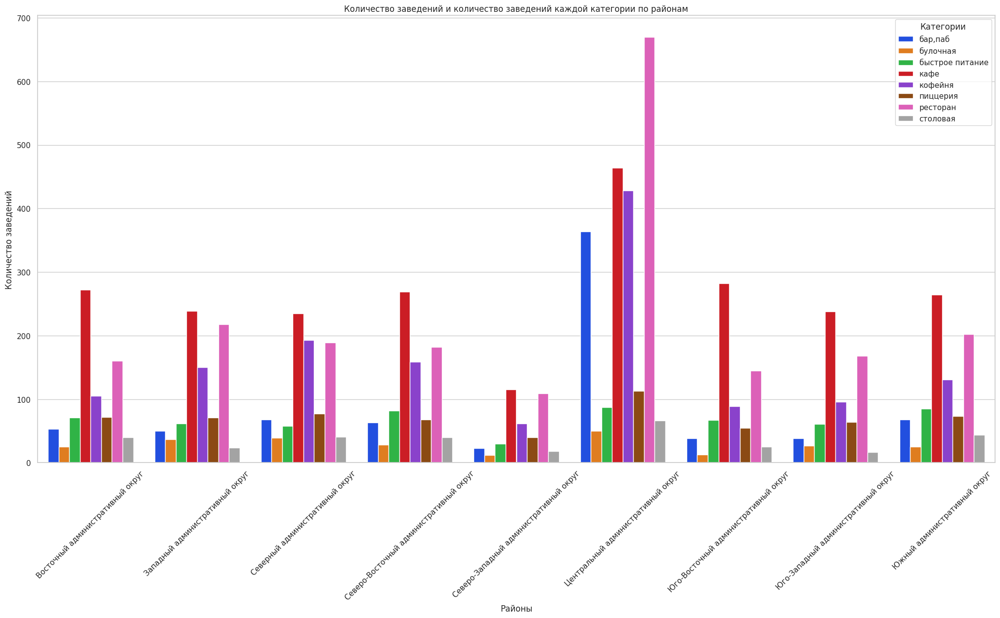

In [30]:
# Группируем данные по районам и категориям
grouped = work_data.groupby(['district', 'category'])['name'].count().reset_index()

# Строим столбчатую диаграмму
plt.figure(figsize=(25, 12))
sns.barplot(x='district', y='name', hue='category', data=grouped)
plt.xticks(rotation=45)
plt.title('Количество заведений и количество заведений каждой категории по районам')
plt.xlabel('Районы')
plt.ylabel('Количество заведений')
plt.legend(title='Категории', loc='upper right')
plt.show()

- Центральный административный округ лидирует по количеству баров, кафе, кофейн и ресторанов, это и не удивительно туристическое место. большой поток людей. По остальным районам все примерно одинаково, только выбивается Северо-Западный административный округ, общее количество заведений меньше чем в остальных и по всем категориям тоже меньше.

### Распределение средних рейтингов по категориям заведений.

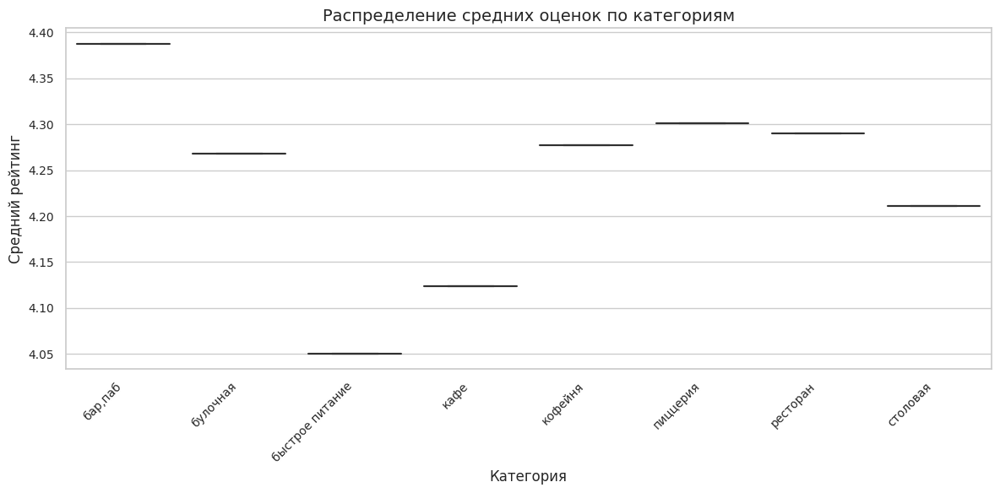

In [31]:
# группировка данных по категориям и вычисление среднего рейтинга
mean_ratings = work_data.groupby('category')['rating'].mean().reset_index()
plt.figure(figsize=(12, 6))
sns.boxplot(x='category', y='rating', data=mean_ratings)
plt.title('Распределение средних оценок по категориям', fontsize=14)
plt.xlabel('Категория', fontsize=12)
plt.ylabel('Средний рейтинг', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

- У баров в среднем оценки лучше, чем в остальных категориях. Оценки просидают у заведений быстрого питания и кафе в районе 4.05 , 4,1. В общем, большенство заведений имеют рейтинг от 4,21 до 4,3.
- Разброс не такой сильный и если у какой-то категори низкий рейтинг, этому есть обьяснение.

- У категории быстрого питание низкий рейтинг из низкого качества продуктов, все мы ели шаурму не втом месте)

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.

In [32]:
rating_df = work_data.groupby('district', as_index=False)['rating'].agg('median')
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

- Как и ожидалось в центре средняя оценка выше чем в остальных и держиться в районе 4.4. По большенству районов москвы рейтинг держиться в районе 4,27 - 4,3. Юго - Восточный и Северо - Восточный административные округа и район люберец отстают от общей оценки и держат планку в районе 4.2.

### Отображение всех заведений датасета на карте с помощью кластеров.

In [33]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
work_data.apply(create_clusters, axis=1)

# выводим карту
m

- Большая часть заведений находится в центре, что может быть связано с большим потоком туристов и жителей города в этом районе.

### Топ-15 улиц по количеству заведений. График распределения количества заведений и их категорий по этим улицам.

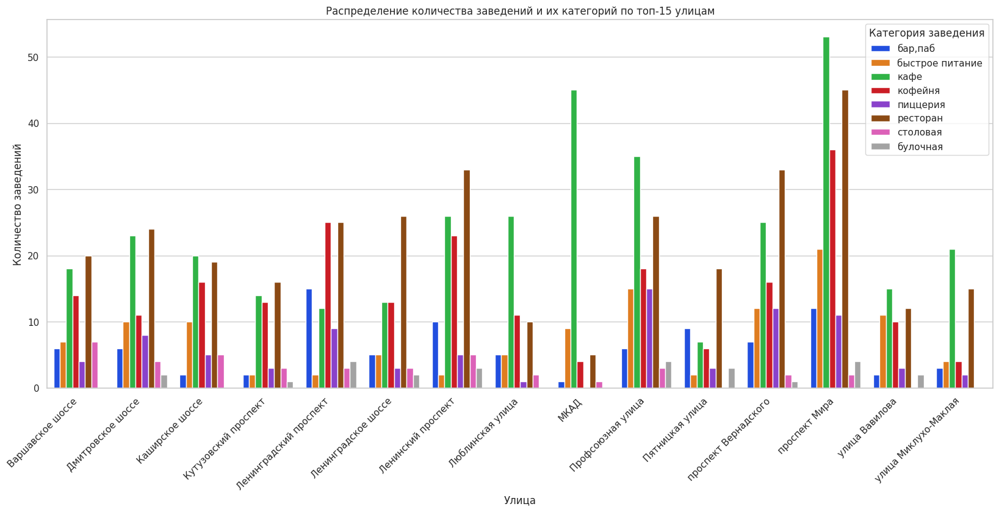

In [34]:
# получаем топ-15 улиц по количеству заведений
streets = work_data['address'].str.split(',', expand=True)[1].str.strip()
top_15_streets = streets.value_counts().head(15).index.tolist()

# фильтруем только улицы из топ-15
df_top_15_streets = work_data[streets.isin(top_15_streets)]

# считаем количество заведений по улицам и категориям
grouped = df_top_15_streets.groupby(['street', 'category'])['name'].count().reset_index()

# построение графика
plt.figure(figsize=(20, 8))
sns.barplot(x='street', y='name', hue='category', data=grouped)
plt.title('Распределение количества заведений и их категорий по топ-15 улицам')
plt.xlabel('Улица')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Категория заведения', loc='upper right')
plt.show()

- Проспект мира лидирует по кол-ву заведений, это связанно с тем что она длинная и находиться в туристическом районе москвы, рядом с ВДНХ. 
- На МКАДЕ анамальное количество кафе, связано с тем, что большое количество водителей останавливается перекусть,получается выгодно строить рядом с большой трассой кафе.

### Улицы, на которых находится только один объект общепита.

Для каждой улицы с одним заведением на карте добавляется маркер с координатами этой улицы.

In [35]:
# находим улицы, на которых находится только один объект общепита
street_counts = work_data['street'].value_counts()
one_place_streets = street_counts[street_counts == 1].index.tolist()

# фильтруем датасет, оставляя только улицы с одним заведением
one_place_df = work_data[work_data['street'].isin(one_place_streets)]

# группируем по улицам и находим координаты для каждой улицы
grouped_one_place_df = one_place_df.groupby('street').mean().reset_index()
grouped_one_place_df = pd.merge(grouped_one_place_df, work_data[['street', 'lat', 'lng', 'name', 'category']], on='street', how='left')
grouped_one_place_df.drop_duplicates(subset='street', inplace=True)

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
a = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(a)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat_x'], row['lng_x']],
        popup=f"{row['name']} {row['rating']} {row['category']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
grouped_one_place_df.apply(create_clusters, axis=1)

# выводим карту
a

-   Большое кол-во улиц с одним заведением находятся в центре, это скорее всего связано с тем, что в центре улицы короткие и невыгодно держать большое количество заведений на одной улице.

-   Также можно предположить, что на этих улицах высокая конкуренция, что делает открытие новых заведений более рискованным.


- Относительно заведений в других районах можно сказать, что они представляют собой уникальные и редкие объекты, которые могут иметь особый характер и привлекать внимание посетителей и туристов. Однако, наличие только одного заведения на улице может означать, что эта улица не является популярной для размещения общепита, и потенциально может не иметь высокого трафика посетителей.

### Как удалённость от центра влияет на цены в заведениях?

Чтобы проанализировать влияние удаленности от центра на цены в заведениях, можно визуально сравнить цены в Центральном административном округе (ЦАО) с ценами в других районах. Для этого можно использовать цвета на карте: чем темнее цвет района, тем выше медианное значение столбца "middle_avg_bill".

In [36]:
#пары район-медианное значение среднего чека
df_median_bill = work_data.groupby('district')['middle_avg_bill'].median().reset_index()

moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
k = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний счет',
).add_to(k)

# выводим карту
k

- Как и ожидалось в центральный и западный административные округа лидируют по среднему счету по Москве. Это связано с тем, что основная делавая активность проходит в этих округах.


- В целом, можно сделать вывод, что удаленность от центра города влияет на цены в заведениях. В более удаленных районах цены в среднем ниже, чем в центре города.

### Вывод.

**Из проведенного анализа можно сделать вывод:**

**Категории заведений:**

- Москве наибольшее количество заведений общественного питания относится к категориям кафе, рестораны и кофейни.
- Большинство заведений являются несетевыми, однако сетевые заведения также имеют значительное присутствие на рынке.
- Лидерами среди сетевых заведений являются "Шоколадница", "Доминос Пицца" и "Додо Пицца".

**Кол-во мест:**

- В заведениях, кроме булочных и пиццерий, максимальное количество посадочных мест обычно составляет 300, а среднее количество мест - около 150. Однако у булочных и пиццерий сетевых мест больше.

**Рейтинг:**

- Средняя оценка заведений в категории баров выше, чем в других категориях, что может свидетельствовать о более высоком качестве обслуживания и продуктов в барах.
- Заведения быстрого питания и кафе имеют более низкие оценки, что может быть связано с низким качеством продуктов и/или обслуживания.
- Большинство заведений имеют рейтинг от 4,21 до 4,3, что указывает на достаточно стабильный уровень качества обслуживания в общепите в Москве.
- Средняя оценка заведений в центре Москвы выше, чем в других районах, что может быть связано с более высоким уровнем конкуренции и требований к качеству обслуживания в центре города.

**Расположение:**

- В центральном административном округе Москвы больше всего заведений общественного питания, что объясняется его туристическим потенциалом и большим потоком людей.
- Большая часть заведений находится в центре, что может быть связано с большим потоком туристов и жителей города в этом районе.
- Наличие только одного заведения на улице в центре может быть связано с конкуренцией и невыгодностью держать большое количество заведений на одной улице. В других районах это может быть связано с низким спросом на общепит на данной улице.

**Цены:**

- Цены в заведениях в центре города выше, чем в более удаленных районах, что может быть связано с более высокой арендной платой и требованиями к качеству обслуживания в центре города.

- Средний чек центрального округа самый высокий, что не удивительно. Не сильно по цене уступает и Западный округ. Бюджетные заведения легче встретить ЮАО, ЮВАО и СВАО.

## Детализируем исследование: открытие кофейни

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [37]:
coffee_df = work_data[work_data['category'] == 'кофейня']
print(f"Всего кофеен в датасете: {len(coffee_df)}")

Всего кофеен в датасете: 1413


In [38]:
coffee_district = coffee_df.groupby('district', as_index=False)['name'].agg('count').sort_values('name', ascending=False)

# создаём карту Москвы
с = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Кол-во кофеен по районам',
).add_to(с)

# выводим карту
с

In [39]:
# Количеством кофеен по районам
print("Количеством кофеен по районам:")
print(coffee_district)

Количеством кофеен по районам:
                                  district  name
5       Центральный административный округ   428
2          Северный административный округ   193
3  Северо-Восточный административный округ   159
1          Западный административный округ   150
8             Южный административный округ   131
0         Восточный административный округ   105
7      Юго-Западный административный округ    96
6     Юго-Восточный административный округ    89
4   Северо-Западный административный округ    62


- Делаем карту кофеен в западном административном округе

In [40]:
coffee_df_central = coffee_df[coffee_df['district'] == 'Западный административный округ']
# создаём карту Москвы
i = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(i)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_df_central.apply(create_clusters, axis=1)

# выводим карту
i

- Больше всего кофеен находится в Центральном административном округе. Особенностью расположения кофеен можно назвать их концентрацию в центральной части города, где находятся многочисленные офисные здания, торговые центры, туристические достопримечательности и другие места с высоким трафиком посетителей. 
- Также можно заметить, что в некоторых округах количество кофеен значительно ниже, возможно, это связано с менее популярными районами или с тем, что эти районы не являются центральными и имеют более низкую плотность населения и бизнеса.

### Круглосуточные кофейни.

In [41]:
# отфильтровать только круглосуточные кофейни
round_the_clock = coffee_df[coffee_df['is_24/7'] == True]

# вывести количество круглосуточных кофеен
print(f"Количество круглосуточных кофеен: {len(round_the_clock)}")

Количество круглосуточных кофеен: 59


In [42]:
# отфильтровать только круглосуточные кофейни
round_the_clock = coffee_df_central[coffee_df_central['is_24/7'] == True]

# вывести количество круглосуточных кофеен
print(f"Количество круглосуточных кофеен в западном административном округе: {len(round_the_clock)}")

Количество круглосуточных кофеен в западном административном округе: 9


In [43]:
# отфильтровать только круглосуточные кофейни
round_the_clock_west = coffee_df_central[coffee_df_central['is_24/7'] == True]
# создаём карту Москвы
b = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(b)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
round_the_clock_west.apply(create_clusters, axis=1)

# выводим карту
b

- Мы наблюдаем нехватку круглосуточных кофеен, а в западном админ. округе их всего лишь 9!

### Рейтинги кофеен. Распределение по районам.

In [44]:
#пары район-медианное значение среднего чека
df_median_bill_coffee = coffee_df.groupby('district')['middle_avg_bill'].median().reset_index()

# создаём карту Москвы
q = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_median_bill_coffee,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний счет',
).add_to(q)

# выводим карту
q

- средний счет в запападном административном округе самый высокий по Москве. За ним идет центральный район.

In [45]:

rating_coffee_df = coffee_df.groupby('district', as_index=False)['rating'].agg('median')
# создаём карту Москвы
w = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
     geo_data=state_geo,
     data=rating_coffee_df,
     columns=['district', 'rating'],
     key_on='feature.name',
     fill_color='YlGn',
     fill_opacity=0.8,
     legend_name='Районы по рейтингам кофеен ',
 ).add_to(w)

# выводим карту
w

- А это уже интересно, при высоком среднем счете рейтинг у западного административного округа просидает.

### На какую стоимость чашки капучино стоит ориентироваться?

In [46]:
#Функция для вычисления средней цены на чашку капучино. Принимает на вход датафрейм с информацией о кофейнях.
def average_cappuccino_price(dataframe):
    # Создание пустого списка для хранения цен на капучино
    cappuccino_prices = []

    # Перебор всех значений в столбце 'features' датафрейма
    for feature in dataframe['avg_bill']:
        # Если значение является строкой
        if isinstance(feature, str):
            # Поиск цены на капучино в строке с помощью регулярного выражения
            match = re.search(r'Цена чашки капучино:\d+–(\d+)', feature)
            # Если цена на капучино найдена, добавляем ее в список цен
            if match:
                cappuccino_prices.append(int(match.group(1)))

    # Вычисление средней цены на капучино
    avg_cappuccino_price = sum(cappuccino_prices) / len(cappuccino_prices)

    # Округление средней цены до двух знаков после запятой
    avg_cappuccino_price = round(avg_cappuccino_price, 2)
    #Средняя цена на чашку капучино.
    return avg_cappuccino_price

In [47]:
print('Средняя цена на чашку капучино равна в западном административном округе:', average_cappuccino_price(coffee_df_central))

Средняя цена на чашку капучино равна в западном административном округе: 225.85


In [48]:
# вывести количество круглосуточных кофеен
print(f"Количество круглосуточных кофеен: {len(round_the_clock_west)}")

Количество круглосуточных кофеен: 9


### Вывод

**Рекомендации:**  

1. Обратите внимание на западный административный округ, так как в этом районе средний счет самый высокий по Москве. Это может указывать на то, что в этом районе много людей, готовых потратить деньги на качественный кофе и дополнительные услуги. Кроме того, здесь относительно небольшое количество круглосуточных кофеен, что может создать дополнительные возможности для вашего бизнеса.

4. Учитывайте среднюю цену на чашку капучино в 225 рублей, чтобы определить ценовую политику вашей кофейни. Вам, возможно, стоит установить более конкурентоспособные цены, чтобы привлечь посетителей.

5. Разработайте уникальную концепцию кофейни, чтобы выделиться на фоне конкурентов. Например, вы можете предложить редкие сорта кофе, уникальный дизайн интерьера или необычные десерты и закуски.

6. Рассмотрите возможность сделать свою кофейню круглосуточной, так как в западном административном округе мало таких заведений. Это может привлечь дополнительных посетителей и увеличить доходы вашего бизнеса.

## Презентация

Презентация: https://disk.yandex.ru/i/smNVvsY_NsXilw